This notebook showcases our attempt to segment satellite images according to the pixel content (building, vegetation, etc.). Our idea was to train a model to estimate LST based on these segmented images. Ultimately, the ratio of pixels labeled as unknown was too high for the model to give a good performance, so we opted for other methods. 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


✓ Saved /content/drive/MyDrive/NYC_osm_labels.tif
    other:  858.5 M  (28.2 %)
 building:  222.5 M  ( 7.3 %)
     road:  283.3 M  ( 9.3 %)
      veg:  190.8 M  ( 6.3 %)
    water:   53.4 M  ( 1.8 %)
      out: 1441.1 M  (47.3 %)


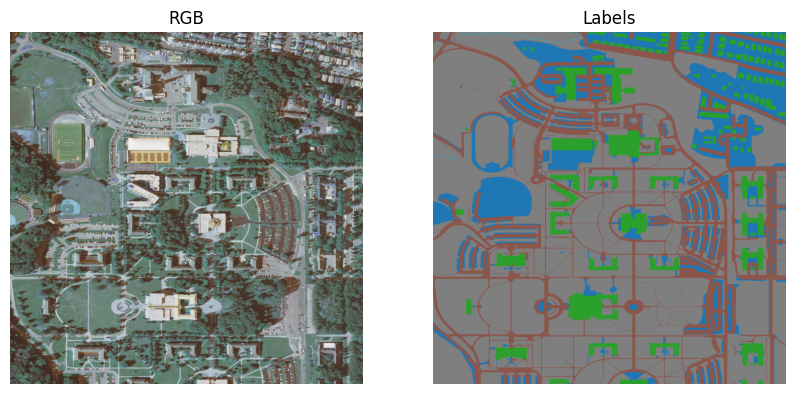

In [ ]:
#──────────────────────────────────────────────────────────────────────────
# 0.  Install & imports  (run once)
#──────────────────────────────────────────────────────────────────────────
!pip install -q osmnx geopandas rasterio numpy matplotlib scipy

import osmnx as ox, geopandas as gpd, rasterio, numpy as np, matplotlib.pyplot as plt
from rasterio.features import rasterize
from scipy.ndimage import binary_dilation
import random

ox.settings.use_cache = True
ox.settings.log_console = False

#──────────────────────────────────────────────────────────────────────────
# 1.  Paths & NYC polygon
#──────────────────────────────────────────────────────────────────────────
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'   # ← adjust if needed
out_fp    = '/content/drive/MyDrive/NYC_osm_labels.tif'

nyc_poly = ox.geocode_to_gdf("New York City, USA").geometry.iloc[0]  # WGS84

#──────────────────────────────────────────────────────────────────────────
# 2.  Raster metadata & polygon reprojection
#──────────────────────────────────────────────────────────────────────────
with rasterio.open(mosaic_fp) as src:
    H, W  = src.height, src.width
    crs   = src.crs
    tr    = src.transform
    meta  = src.profile.copy()
meta.update(count=1, dtype='uint8', compress='lzw')

nyc_poly = gpd.GeoSeries([nyc_poly], crs='EPSG:4326').to_crs(crs).geometry.iloc[0]

# NYC mask (1 = inside, 0 = outside)
nyc_mask = rasterize([(nyc_poly, 1)], out_shape=(H, W), transform=tr,
                     fill=0, all_touched=True, dtype='uint8')

#──────────────────────────────────────────────────────────────────────────
# 3.  Fetch OSM layers  (fast thanks to cache)
#──────────────────────────────────────────────────────────────────────────
print("Downloading OSM layers …")

bld = ox.features_from_polygon(nyc_poly, tags={'building': True}).to_crs(crs)

road = ox.features_from_polygon(nyc_poly, tags={'highway': True}).to_crs(crs)

veg = ox.features_from_polygon(
        nyc_poly,
        tags={'natural':['wood','scrub'],
              'landuse':['forest','grass','meadow'],
              'leisure':['park','garden','greenfield'],
              'landcover':['grass']}
      ).to_crs(crs)

wat = ox.features_from_polygon(
        nyc_poly,
        tags={'natural':['water'],
              'waterway': True,
              'landuse':['reservoir','basin']}
      ).to_crs(crs)

#──────────────────────────────────────────────────────────────────────────
# 4.  Rasterise layers
#──────────────────────────────────────────────────────────────────────────
def to_mask(gdf):
    return rasterize(((g,1) for g in gdf.geometry if g.is_valid),
                     out_shape=(H, W), transform=tr,
                     fill=0, all_touched=True, dtype='uint8')

mask_bld = to_mask(bld)
mask_veg = to_mask(veg)
mask_wat = to_mask(wat)

# Roads: rasterise thin lines, then thicken 5 px (≈ 5 m at 1 m GSD)
mask_road_thin = to_mask(road)
mask_road = binary_dilation(mask_road_thin, iterations=5).astype('uint8')

#──────────────────────────────────────────────────────────────────────────
# 5.  Combine → label grid
#     0 other | 1 building | 2 road | 3 veg | 4 water | 255 outside
#──────────────────────────────────────────────────────────────────────────
lab = np.full((H, W), 255, dtype='uint8')     # start outside city
lab[nyc_mask==1] = 0                          # inside → other

# priority: water > veg > road > building (adjust if needed)
lab[(nyc_mask==1) & (mask_bld ==1)] = 1
lab[(nyc_mask==1) & (mask_road==1)] = 2
lab[(nyc_mask==1) & (mask_veg ==1)] = 3
lab[(nyc_mask==1) & (mask_wat ==1)] = 4

#──────────────────────────────────────────────────────────────────────────
# 6.  Save & class counts
#──────────────────────────────────────────────────────────────────────────
with rasterio.open(out_fp, 'w', **meta) as dst:
    dst.write(lab, 1)
print("✓ Saved", out_fp)

names = {0:'other',1:'building',2:'road',3:'veg',4:'water',255:'out'}
vals, cnt = np.unique(lab, return_counts=True)
total = cnt.sum()
for v,c in zip(vals,cnt):
    print(f"{names[v]:>9}: {c/1e6:6.1f} M  ({100*c/total:4.1f} %)")

#──────────────────────────────────────────────────────────────────────────
# 7.  Random overlay preview
#──────────────────────────────────────────────────────────────────────────
with rasterio.open(mosaic_fp) as src:
    while True:
        x, y = random.randint(0, W-1024), random.randint(0, H-1024)
        win  = rasterio.windows.Window(x, y, 1024, 1024)
        rgb  = src.read([3,2,1], window=win).transpose(1,2,0)/255
        lbl  = lab[y:y+1024, x:x+1024]
        if rgb.sum() > 0 and (lbl != 255).any():
            break

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(rgb);       plt.title("RGB");    plt.axis('off')
plt.subplot(1,2,2); plt.imshow(lbl, cmap='tab10'); plt.title("Labels"); plt.axis('off')
plt.show()


Updating vegetation mask …
✓ vegetation updated & saved /content/drive/MyDrive/NYC_osm_labels.tif
    other: 53.2%
 building: 13.8%
     road: 17.6%
      veg: 12.4%
    water:  3.0%


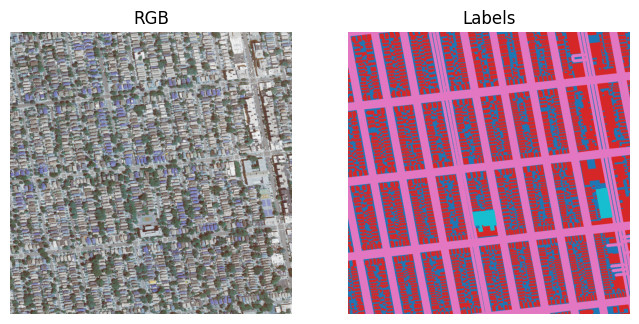

In [ ]:
# ── REFRESH VEGETATION ONLY ──────────────────────────────────────────────
veg_tags = {
    'natural'  : ['wood', 'scrub'],
    'landuse'  : ['forest', 'grass', 'meadow'],
    'leisure'  : ['park', 'garden', 'greenfield', 'pitch', 'playground'],
    'landcover': ['grass']
}

print("Updating vegetation mask …")
veg = ox.features_from_polygon(nyc_poly, tags=veg_tags).to_crs(crs)
mask_veg = rasterize(((g,1) for g in veg.geometry if g.is_valid),
                     out_shape=(H, W), transform=tr,
                     fill=0, all_touched=True, dtype='uint8')

# overwrite veg on the existing label grid (lab must be in memory)
lab[(nyc_mask==1) & (mask_veg==1)] = 3

# save updated TIFF
with rasterio.open(out_fp, 'w', **meta) as dst:
    dst.write(lab, 1)
print("✓ vegetation updated & saved", out_fp)

# quick distribution check
vals, cnt = np.unique(lab[(lab!=255)], return_counts=True)
names = ['other','building','road','veg','water']
total = cnt.sum()
for v,c in zip(vals,cnt):
    print(f"{names[v]:>9}: {100*c/total:4.1f}%")

# preview one tile to confirm lawns/fields now veg
while True:
    x, y = random.randint(0, W-1024), random.randint(0, H-1024)
    with rasterio.open(mosaic_fp) as src:
        rgb = src.read([3,2,1], window=rasterio.windows.Window(x,y,1024,1024)).transpose(1,2,0)/255
    lbl = lab[y:y+1024, x:x+1024]
    if (rgb.sum()>0) and (lbl==3).any():          # ensure veg present
        break

plt.figure(figsize=(8,4))
plt.subplot(1,2,1); plt.imshow(rgb); plt.title("RGB"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(lbl, cmap='tab10'); plt.title("Labels"); plt.axis('off')
plt.show()


 · buildings…
 · roads…
 · vegetation…
 · water…
✓ Saved label map → /content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif
    other:  53.2%
 building:  15.0%
     road:  18.4%
      veg:  10.4%
    water:   3.0%


<ipython-input-1-b64582064087>:92: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', 6)


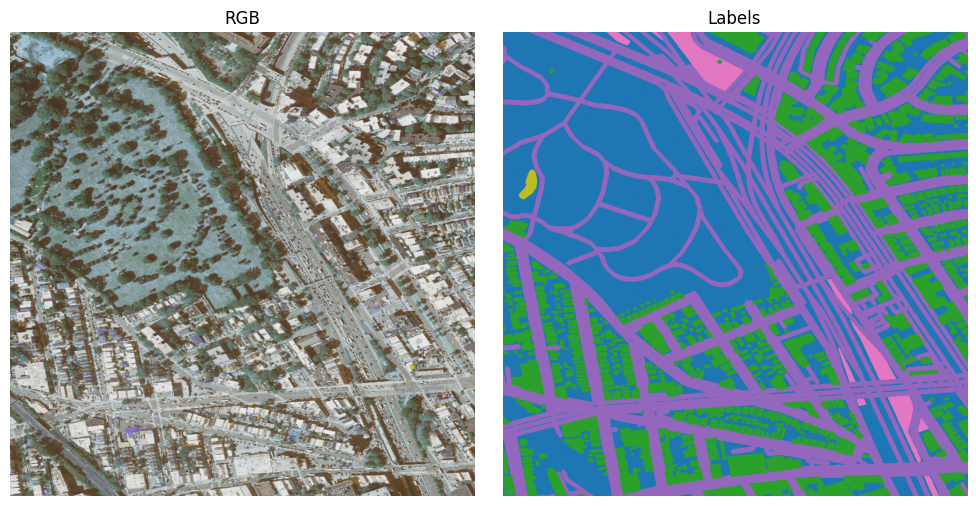

In [ ]:
#──────────────────────────────────────────────────────────────────────────
# NYC land‑cover from OSM only  |  classes: 0 other ·1 bldg ·2 road ·3 veg ·4 water
# writes:   /…/NYC_osm_labels.tif   (same dir as the input mosaic)
#──────────────────────────────────────────────────────────────────────────
!pip install -q osmnx geopandas rasterio numpy matplotlib scipy

import os, random, gc
import osmnx as ox, geopandas as gpd, rasterio, numpy as np, matplotlib.pyplot as plt
from rasterio.features import rasterize
from scipy.ndimage import binary_dilation

ox.settings.use_cache, ox.settings.log_console = True, False

# ── 1. paths ────────────────────────────────────────────────────────────
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'    # ← adjust if needed
out_fp    = os.path.join(os.path.dirname(mosaic_fp), 'NYC_osm_labels.tif')

# ── 2. NYC polygon & raster geo‑info ────────────────────────────────────
nyc_poly = ox.geocode_to_gdf("New York City, USA").geometry.iloc[0]   # WGS84

with rasterio.open(mosaic_fp) as src:
    H, W  = src.height, src.width
    crs   = src.crs
    tr    = src.transform
    meta  = src.profile.copy()
meta.update(count=1, dtype='uint8', compress='lzw')

nyc_poly = gpd.GeoSeries([nyc_poly], crs='EPSG:4326').to_crs(crs).geometry.iloc[0]
nyc_mask = rasterize([(nyc_poly,1)], out_shape=(H,W), transform=tr, fill=0, dtype='uint8')

# ── 3. init label grid (only big array kept) ────────────────────────────
lab = np.full((H, W), 255, dtype='uint8')   # 255 outside
lab[nyc_mask==1] = 0                        # 0 inside city by default
del nyc_mask; gc.collect()

# ── 4. helper to fetch → rasterize → merge → free ───────────────────────
def fetch_raster_merge(name, tags, priority_id, buffer_px=0):
    print(f" · {name}…", flush=True)
    gdf = ox.features_from_polygon(nyc_poly, tags=tags).to_crs(crs)

    # roads: optional pixel dilation after raster
    if buffer_px > 0:
        mask = rasterize(((g,1) for g in gdf.geometry if g.is_valid),
                         out_shape=(H,W), transform=tr,
                         fill=0, all_touched=True, dtype='uint8')
        mask = binary_dilation(mask, iterations=buffer_px).astype('uint8')
    else:
        mask = rasterize(((g,1) for g in gdf.geometry if g.is_valid),
                         out_shape=(H,W), transform=tr,
                         fill=0, all_touched=True, dtype='uint8')

    lab[(lab==0) & (mask==1)] = priority_id
    del gdf, mask
    gc.collect()

# ── 5. fetch → rasterize each layer (order = priority) ──────────────────
print("Downloading + rasterising OSM layers")
fetch_raster_merge('buildings', {'building':True}, priority_id=1)

fetch_raster_merge('roads',     {'highway':True},  priority_id=2, buffer_px=5)  # 5 px ≈ 5 m

veg_tags = {'natural'  : ['wood','scrub'],
            'landuse'  : ['forest','grass','meadow'],
            'leisure'  : ['park','garden','greenfield','pitch','playground'],
            'landcover': ['grass']}
fetch_raster_merge('vegetation', veg_tags, priority_id=3)

wat_tags = {'natural':['water'],
            'waterway':True,
            'landuse':['reservoir','basin']}
fetch_raster_merge('water', wat_tags, priority_id=4)

# ── 6. save & stats ─────────────────────────────────────────────────────
with rasterio.open(out_fp, 'w', **meta) as dst:
    dst.write(lab, 1)
print("✓ Saved label map →", out_fp)

inside = lab[lab!=255]
names  = ['other','building','road','veg','water']
for cid in range(5):
    pct = 100*(inside==cid).sum()/inside.size
    print(f"{names[cid]:>9}: {pct:5.1f}%")

# ── 7. quick preview tile ───────────────────────────────────────────────
with rasterio.open(mosaic_fp) as src:
    while True:
        x,y = random.randint(0,W-1024), random.randint(0,H-1024)
        rgb = src.read([3,2,1], window=rasterio.windows.Window(x,y,1024,1024)).transpose(1,2,0)/255
        lbl = lab[y:y+1024, x:x+1024]
        if rgb.sum()>0 and (lbl!=255).any(): break

cmap = plt.cm.get_cmap('tab10', 6)
plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(rgb); plt.title("RGB"); plt.axis('off')
plt.subplot(1,2,2); plt.imshow(lbl, cmap=cmap, vmin=0, vmax=5); plt.title("Labels"); plt.axis('off')
plt.tight_layout(); plt.show()


In [ ]:
import numpy as np
import rasterio
from rasterio.windows import Window

# ▶ adjust these
mask_fp    = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'  # your 5‑class mask (0–4, 255=outside)
tile_size  = 30    # size of each grid in pixels (30 m)
cell_size  = 5     # size of each micro‑cell in pixels (5 m)
n_classes  = 5     # number of real classes (0–4)
#───────────────────────────────────────────────────────────────────────────
# derived
M = tile_size // cell_size   # e.g. 30//5 = 6

# 1) load full mask
with rasterio.open(mask_fp) as src:
    mask = src.read(1)
H, W = mask.shape

# 2) loop over each 30×30 tile and build its GSCFM
gscfm_list = []     # will hold an array shape (M,M,5) per tile
tile_origins = []   # tile_origins[k] = (y0,x0) of that gscfm_list[k]

for y0 in range(0, H, tile_size):
    for x0 in range(0, W, tile_size):
        if y0+tile_size>H or x0+tile_size>W:
            continue  # skip partial tiles at edges
        tile = mask[y0:y0+tile_size, x0:x0+tile_size]
        if np.all(tile==255):
            continue  # skip tiles fully outside NYC

        # init M×M×5
        gscfm = np.zeros((M, M, n_classes), dtype=float)

        # fill each micro‑cell
        for i in range(M):
            for j in range(M):
                ys = i*cell_size
                xs = j*cell_size
                patch = tile[ys:ys+cell_size, xs:xs+cell_size]
                total = patch.size
                for l in range(n_classes):
                    gscfm[i, j, l] = np.count_nonzero(patch == l) / total

        gscfm_list.append(gscfm)
        tile_origins.append((y0, x0))

# now gscfm_list[k] is the M×M×5 GSCFM for the tile at tile_origins[k]
print(f"Generated {len(gscfm_list)} GSCFM blocks of shape {M}×{M}×{n_classes}")


Generated 1791285 GSCFM blocks of shape 6×6×5


In [ ]:
!pip install ace_tools

In [ ]:
import numpy as np
import pandas as pd

# pick block #0 (the first 6×6×5 tile)
block0 = gscfm_list[0]
M, _, d = block0.shape    # should be (6,6,5)

# flatten into a table of M*M rows, one per cell
df = pd.DataFrame(
    block0.reshape(-1, d),
    columns=['other','building','road','vegetation','water']
)
# recover the (row,col) cell indices
df['row'] = np.repeat(np.arange(M), M)
df['col'] = np.tile(np.arange(M), M)

# reorder columns and show the top 10
df = df[['row','col','other','building','road','vegetation','water']]
df.head(10)


,row,col,other,building,road,vegetation,water
0,0,0,0.0,0.0,0.0,0.0,0.0
1,0,1,0.0,0.0,0.0,0.0,0.0
2,0,2,0.0,0.0,0.0,0.0,0.0
3,0,3,0.0,0.0,0.0,0.0,0.0
4,0,4,0.0,0.0,0.0,0.0,0.0
5,0,5,0.0,0.0,0.0,0.0,0.0
6,1,0,0.0,0.0,0.0,0.0,0.0
7,1,1,0.0,0.0,0.0,0.0,0.0
8,1,2,0.0,0.0,0.0,0.0,0.0
9,1,3,0.0,0.0,0.0,0.0,0.0


In [ ]:
import numpy as np
import rasterio

# ── PARAMETERS ────────────────────────────────────────────────────────────
mask_fp       = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'
tile_size     = 30       # pixels (30 m)
cell_size     = 5        # pixels (5 m)
n_classes     = 5        # classes 0–4
inside_thresh = 0.9      # require ≥80% of tile inside NYC

# derived
M = tile_size // cell_size   # = 6 micro‑cells per side

# ── LOAD MASK & BUILD nyc_mask ───────────────────────────────────────────
with rasterio.open(mask_fp) as src:
    mask = src.read(1)      # shape (H, W)
H, W = mask.shape

# boolean mask: True for pixels inside NYC (0–4), False for outside (255)
nyc_mask = (mask != 255)

# ── SLIDE & BUILD GSCFM LIST ─────────────────────────────────────────────
gscfm_list   = []   # each entry: (M, M, 5) array of class‐fractions
tile_origins = []   # each entry: (y0, x0) of that tile

G = tile_size
for y0 in range(0, H, G):
    for x0 in range(0, W, G):
        y1, x1 = y0 + G, x0 + G
        # skip tiles that would run off edge
        if y1 > H or x1 > W:
            continue

        # fraction of pixels inside NYC
        win = nyc_mask[y0:y1, x0:x1]
        if win.mean() < inside_thresh:
            continue

        # extract the label values for this tile
        tile = mask[y0:y1, x0:x1]   # shape (G, G)

        # build the M×M×5 fraction block
        block = np.zeros((M, M, n_classes), dtype=float)
        for i in range(M):
            ys, ye = i*cell_size, (i+1)*cell_size
            for j in range(M):
                xs, xe = j*cell_size, (j+1)*cell_size
                patch = tile[ys:ye, xs:xe]
                total = patch.size
                if total == 0:
                    continue
                for cls in range(n_classes):
                    block[i, j, cls] = np.count_nonzero(patch == cls) / total

        gscfm_list.append(block)
        tile_origins.append((y0, x0))

print(f"Generated {len(gscfm_list):,} GSCFM blocks of shape {M}×{M}×{n_classes}")


Generated 1,784,435 GSCFM blocks of shape 6×6×5


In [ ]:
import numpy as np
import pandas as pd
import random

# Find all block indices that contain at least two different classes (e.g. building & veg)
valid_indices = []
for idx, block in enumerate(gscfm_list):
    # Sum fraction over all micro‑cells for each class
    class_totals = block.sum(axis=(0,1))  # length‑5 array
    # Count how many classes appear with non-zero total
    num_classes = np.count_nonzero(class_totals > 0)

    if num_classes >= 2:  # at least two different classes present
        valid_indices.append(idx)

# Pick one at random
chosen_idx = random.choice(valid_indices)
chosen_origin = tile_origins[chosen_idx]
block = gscfm_list[chosen_idx]

print(f"Chosen block index: {chosen_idx}, origin (y0, x0): {chosen_origin}")

# Flatten into DataFrame for inspection
M, _, C = block.shape
df = pd.DataFrame(
    block.reshape(-1, C),
    columns=['other','building','road','vegetation','water']
)
df['row'] = np.repeat(np.arange(M), M)
df['col'] = np.tile(np.arange(M), M)
df = df[['row','col','other','building','road','vegetation','water']]
print(df)



Chosen block index: 789168, origin (y0, x0): (27990, 50820)
    row  col  other  building  road  vegetation  water
0     0    0   0.00       0.0  0.00        1.00    0.0
1     0    1   0.00       0.0  0.00        1.00    0.0
2     0    2   0.00       0.0  0.00        1.00    0.0
3     0    3   0.00       0.0  0.00        1.00    0.0
4     0    4   0.00       0.0  0.00        1.00    0.0
5     0    5   0.00       0.0  0.00        1.00    0.0
6     1    0   0.00       0.0  0.00        1.00    0.0
7     1    1   0.00       0.0  0.00        1.00    0.0
8     1    2   0.00       0.0  0.00        1.00    0.0
9     1    3   0.00       0.0  0.00        1.00    0.0
10    1    4   0.00       0.0  0.00        1.00    0.0
11    1    5   0.00       0.0  0.00        1.00    0.0
12    2    0   0.00       0.0  0.00        1.00    0.0
13    2    1   0.00       0.0  0.00        1.00    0.0
14    2    2   0.00       0.0  0.00        1.00    0.0
15    2    3   0.00       0.0  0.00        1.00    0.0
16   

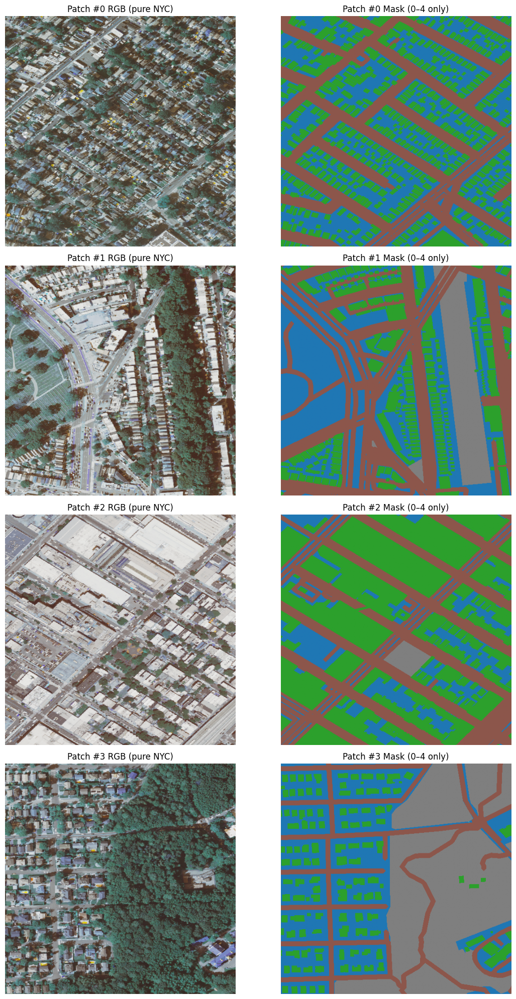

In [ ]:
import random
import numpy as np
import rasterio
from rasterio.windows import Window
import matplotlib.pyplot as plt

# ── paths ────────────────────────────────────────────────────────────────
mask_fp   = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'
# ─────────────────────────────────────────────────────────────────────────

patch_size  = 512
num_samples = 2_000   # try more random draws so you get enough good ones
top_k       = 4       # how many to show

with rasterio.open(mask_fp)   as msk_src, \
     rasterio.open(mosaic_fp) as mos_src:

    H, W = msk_src.height, msk_src.width

    good_tiles = []
    tries = 0
    while len(good_tiles) < top_k and tries < num_samples:
        tries += 1
        y0 = random.randint(0, H - patch_size)
        x0 = random.randint(0, W - patch_size)
        win = Window(x0, y0, patch_size, patch_size)

        # 1) mask check: skip any window that has an outside‐NYC pixel
        lbl = msk_src.read(1, window=win)
        if np.any(lbl == 255):
            continue

        # 2) mosaic check: skip if ALL bands are zero (no‐data)
        #    you can also read mos_src.dataset_mask(), but easiest is:
        rgb = mos_src.read([1,2,3], window=win)
        if rgb.sum() == 0:
            continue

        good_tiles.append((x0, y0))

    # now plot the first few
    fig, axes = plt.subplots(len(good_tiles), 2,
                             figsize=(12, 5*len(good_tiles)))
    for i, (x0, y0) in enumerate(good_tiles):
        win = Window(x0, y0, patch_size, patch_size)

        rgb = mos_src.read([3,2,1], window=win).transpose(1,2,0) / 255.0
        lbl = msk_src.read(1,    window=win)

        ax1, ax2 = axes[i]
        ax1.imshow(rgb)
        ax1.set_title(f'Patch #{i} RGB (pure NYC)')
        ax1.axis('off')

        ax2.imshow(lbl, cmap='tab10', vmin=0, vmax=4)
        ax2.set_title(f'Patch #{i} Mask (0–4 only)')
        ax2.axis('off')

    plt.tight_layout()
    plt.show()


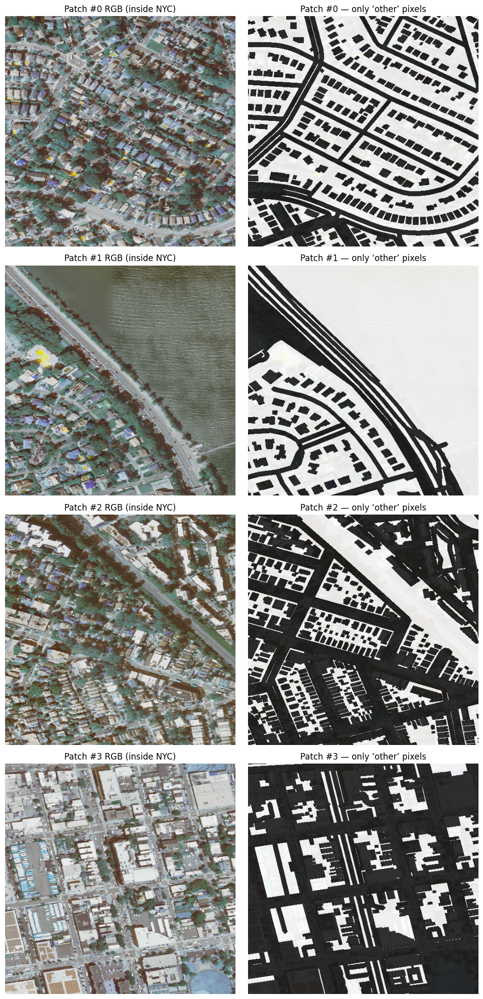

In [ ]:
import random
import numpy as np
import rasterio
from rasterio.windows import Window
import matplotlib.pyplot as plt

# ── adjust these paths ────────────────────────────────────────────────
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'
mask_fp   = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'
# ──────────────────────────────────────────────────────────────────────

patch_size = 512    # size of each square window, in pixels
n_patches  = 4      # how many examples to show

with rasterio.open(mosaic_fp) as mos_src, rasterio.open(mask_fp) as msk_src:
    H, W = msk_src.height, msk_src.width

    examples = []
    while len(examples) < n_patches:
        x0 = random.randint(0, W - patch_size)
        y0 = random.randint(0, H - patch_size)
        win = Window(x0, y0, patch_size, patch_size)

        lbl = msk_src.read(1, window=win)
        # only keep windows fully inside NYC (no 255)
        if (lbl==255).any():
            continue
        # must contain some 'other' (0) *and* some other class (>0)
        if not (lbl==0).any() or not (lbl>0).any():
            continue

        rgb = mos_src.read([3,2,1], window=win).transpose(1,2,0) / 255
        examples.append((rgb, lbl))

    # now plot
    fig, axes = plt.subplots(n_patches, 2, figsize=(10,5*n_patches))
    for i, (rgb, lbl) in enumerate(examples):
        ax_rgb, ax_mask = axes[i]

        ax_rgb.imshow(rgb)
        ax_rgb.set_title(f"Patch #{i} RGB (inside NYC)")
        ax_rgb.axis('off')

        # build a binary mask for 'other' only
        other_mask = (lbl == 0)
        ax_mask.imshow(rgb, alpha=0.6)               # show RGB underneath
        ax_mask.imshow(other_mask, cmap='gray',        # overlay 'other'
                       alpha=0.8, vmin=0, vmax=1)
        ax_mask.set_title(f"Patch #{i} — only ‘other’ pixels")
        ax_mask.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.features import rasterize
import geopandas as gpd
import osmnx as ox

# ─── 1) Paths ─────────────────────────────────────────────────────────────
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'
mask_fp   = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'  # your 5-class OSM mask

# ─── 2) Load the mask & metadata ─────────────────────────────────────────
with rasterio.open(mask_fp) as src:
    lab  = src.read(1)            # 0=other,1=bldg,2=road,3=veg,4=water,255=outside
    crs  = src.crs
    tr   = src.transform
    H, W = lab.shape

# ─── 3) Rasterize NYC polygon ────────────────────────────────────────────
nyc_poly = ox.geocode_to_gdf("New York City, USA").geometry.iloc[0]     # WGS84
nyc_poly = gpd.GeoSeries([nyc_poly], crs='EPSG:4326').to_crs(crs).iloc[0]

nyc_mask = rasterize(
    [(nyc_poly, 1)],
    out_shape=(H, W),
    transform=tr,
    fill=0,
    all_touched=True,
    dtype='uint8'
)

# ─── 4) Build “other”‐inside‐NYC binary mask ───────────────────────────────
other_mask = (lab == 0) & (nyc_mask == 1)   # True exactly where class=0 & inside polygon

# ─── 5) Plot ─────────────────────────────────────────────────────────────
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(14,6))

# 5a) background RGB + magenta overlay for “other”
with rasterio.open(mosaic_fp) as m:
    rgb = m.read([3,2,1]).transpose(1,2,0) / 255.0

ax1.imshow(rgb)
# mask out non-“other” pixels and overlay
ax1.imshow(
    np.ma.masked_where(~other_mask, other_mask),
    cmap=plt.cm.PRGn,      # PRGn goes from magenta→green; we only have 1 level so use magenta end
    vmin=0, vmax=1,
    alpha=0.6
)
ax1.set_title("NYC mosaic + ‘other’ pixels (magenta)", fontsize=14)
ax1.axis('off')

# 5b) just the binary mask in magenta on white
from matplotlib.colors import ListedColormap
cmap = ListedColormap(['white','magenta'])
ax2.imshow(other_mask, cmap=cmap)
ax2.set_title("Binary ‘other’ mask inside NYC", fontsize=14)
ax2.axis('off')

plt.tight_layout()
plt.show()

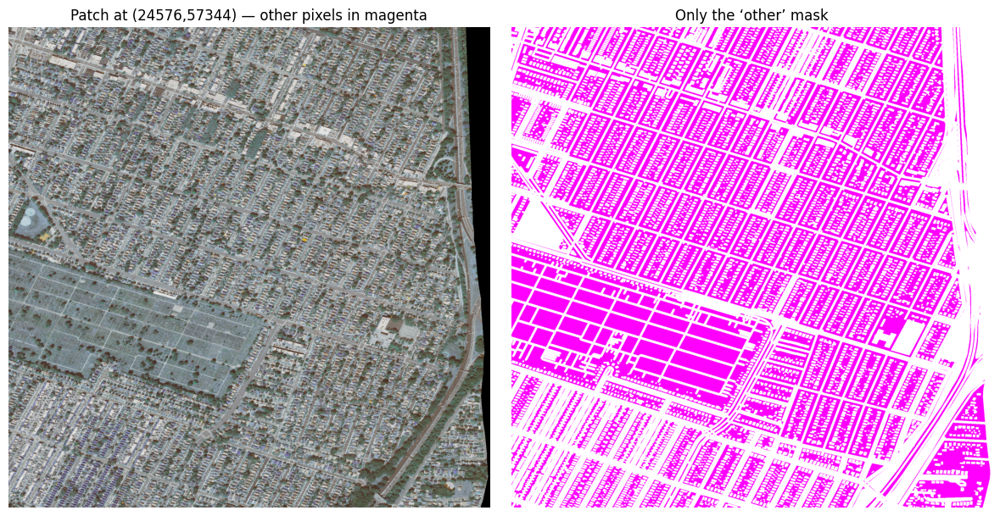

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.windows import Window
from matplotlib.colors import ListedColormap

# ─── paths & tile size ─────────────────────────────────────────────────────
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'
mask_fp   = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'
patch_size = 2048  # adjust down if still too big

# ─── load mask & build binary “other” inside‐NYC mask ──────────────────────
with rasterio.open(mask_fp) as src:
    lab      = src.read(1)                     # your 5‑class mask
    nyc_mask = (lab != 255).astype(bool)       # True inside NYC polygon
other_mask = (lab == 0) & nyc_mask             # True = “other” & inside

H, W = lab.shape

# ─── find candidate windows ───────────────────────────────────────────────
cands = []
for y0 in range(0, H, patch_size):
    for x0 in range(0, W, patch_size):
        if y0+patch_size>H or x0+patch_size>W:
            continue
        win = other_mask[y0:y0+patch_size, x0:x0+patch_size]
        # pick windows that are neither all‑True nor all‑False
        frac = win.mean()
        if 0.05 < frac < 0.95:
            cands.append((y0, x0))

if not cands:
    raise RuntimeError("No patch with a mix of 'other' found—try smaller patch_size")

# ─── grab one at random (or cands[0]) ──────────────────────────────────────
import random
y0, x0 = random.choice(cands)

with rasterio.open(mosaic_fp) as src:
    rgb = (
      src.read([3,2,1], window=Window(x0, y0, patch_size, patch_size))
         .transpose(1,2,0) / 255.0
    )
mask_win = other_mask[y0:y0+patch_size, x0:x0+patch_size]

# ─── plot ─────────────────────────────────────────────────────────────────
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(12,6))

# background + magenta overlay
ax1.imshow(rgb)
ax1.imshow(
    np.ma.masked_where(~mask_win, mask_win),
    cmap=ListedColormap(['none','magenta']),
    alpha=0.6
)
ax1.set_title(f"Patch at ({y0},{x0}) — other pixels in magenta")
ax1.axis('off')

# just the binary mask
ax2.imshow(mask_win, cmap=ListedColormap(['white','magenta']))
ax2.set_title("Only the ‘other’ mask")
ax2.axis('off')

plt.tight_layout()
plt.show()


→ processing imperv1 → class 6


100%|██████████| 24/24 [00:00<00:00, 61.77it/s]


→ processing imperv2 → class 6


100%|██████████| 24/24 [00:00<00:00, 61.18it/s]


→ processing imperv3 → class 6


100%|██████████| 24/24 [00:00<00:00, 65.26it/s]


→ processing bare → class 5


100%|██████████| 24/24 [00:00<00:00, 63.58it/s]


→ processing footways → class 2


100%|██████████| 24/24 [00:00<00:00, 68.10it/s]


→ processing cycle → class 2


100%|██████████| 24/24 [00:00<00:00, 66.21it/s]


→ processing veg1 → class 3


100%|██████████| 24/24 [00:00<00:00, 66.62it/s]


→ processing veg2 → class 3


100%|██████████| 24/24 [00:00<00:00, 67.64it/s]


→ processing veg3 → class 3


100%|██████████| 24/24 [00:00<00:00, 66.42it/s]


→ processing veg4 → class 3


100%|██████████| 24/24 [00:00<00:00, 65.78it/s]


→ processing wat1 → class 4


100%|██████████| 24/24 [00:00<00:00, 62.63it/s]


→ processing wat2 → class 4


100%|██████████| 24/24 [00:00<00:00, 64.67it/s]


→ processing wat3 → class 4


100%|██████████| 24/24 [00:00<00:00, 65.25it/s]


→ closing small holes between buildings/roads …
✅ hybrid mask written: /content/drive/MyDrive/EarthEngine/NYC_osm_hybrid.tif


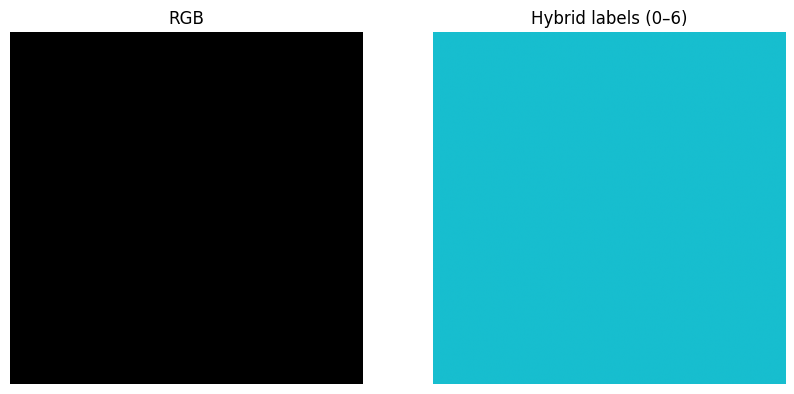

In [ ]:
# ────────────────────────────────────────────────────────────────
# Install & imports (run once)
# ────────────────────────────────────────────────────────────────
!pip install -q osmnx geopandas rasterio shapely scipy
import osmnx as ox, geopandas as gpd, rasterio, numpy as np
from rasterio.features import rasterize
from rasterio.windows import Window
from shapely.geometry import box
from scipy.ndimage import binary_closing
import tqdm

ox.settings.use_cache = True
ox.settings.log_console = False

# ────────────────────────────────────────────────────────────────
# 1) Paths & NYC polygon
# ────────────────────────────────────────────────────────────────
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'
in_mask   = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'  # your 5‑class (0–4,255)
out_mask  = '/content/drive/MyDrive/EarthEngine/NYC_osm_hybrid.tif'

# load raster metadata + NYC polygon
with rasterio.open(mosaic_fp) as src:
    H, W  = src.height, src.width
    crs   = src.crs
    tr    = src.transform
    profile = src.profile.copy()
meta = profile.copy()
meta.update(count=1, dtype='uint8', nodata=255, compress='lzw')

nyc_poly = ox.geocode_to_gdf("New York City, USA").geometry.iloc[0]
nyc_poly = gpd.GeoSeries([nyc_poly], crs='EPSG:4326')\
           .to_crs(crs).geometry.iloc[0]

# read existing mask (0–4 real, 255 outside)
with rasterio.open(in_mask) as src:
    base = src.read(1)

# we’ll start from that:
lab = base.copy()

# ────────────────────────────────────────────────────────────────
# 2) Comprehensive OSM tag dictionary
# ────────────────────────────────────────────────────────────────
tag_groups = {
  # parking, aprons, platforms, etc.
  'imperv1': {'amenity':['parking'],    'landuse':['parking']},
  'imperv2': {'aeroway':['apron']},
  'imperv3': {'railway':['platform']},
  # bare rock/quarry/landfill
  'bare':     {'natural':['bare_rock'], 'landcover':['bare'],
               'landuse':['quarry','landfill']},
  # pedestrian ways / alleys
  'footways': {'highway':['footway','pedestrian','path','track']},
  'cycle':    {'highway':['cycleway']},
  # small green stuff
  'veg1': {'natural':['wood','scrub','heath']},
  'veg2': {'landuse':['forest','grass','meadow','orchard','vineyard']},
  'veg3': {'leisure':['park','garden','pitch','playground']},
  'veg4': {'landcover':['grass','greenfield']},
  # water bits
  'wat1': {'natural':['water']},
  'wat2': {'waterway':['river','stream','canal','drain']},
  'wat3': {'landuse':['reservoir','basin']},
}
# class → code
cls_map = {
  'imperv1': 6, 'imperv2':6, 'imperv3':6,
  'bare':     5,
  'footways': 2, 'cycle':2,        # roads stay as code=2
  'veg1':     3, 'veg2':3, 'veg3':3,'veg4':3,
  'wat1':     4, 'wat2':4, 'wat3':4,
}

# ────────────────────────────────────────────────────────────────
# 3) Windowed rasterization to avoid OOM
# ────────────────────────────────────────────────────────────────
tile = 2048
for name, tags in tag_groups.items():
    code = cls_map[name]
    print(f"→ processing {name} → class {code}")
    # buffer = ensure small overlaps
    for y0 in tqdm.tqdm(range(0, H, tile)):
        for x0 in range(0, W, tile):
            y1, x1 = min(y0+tile, H), min(x0+tile, W)
            win_geom = box(*rasterio.windows.bounds(
                            Window(x0,y0,x1-x0,y1-y0), tr))
            win_geom = gpd.GeoSeries([win_geom], crs=crs)
            # fetch only in-window geometries
            try:
                gdf = ox.geometries_from_polygon(
                        win_geom.iloc[0], tags).to_crs(crs)
            except Exception:
                continue
            if gdf.empty:
                continue
            shapes = ((geom,1) for geom in gdf.geometry if geom.is_valid)
            # rasterize into a small array
            out = rasterize(
              shapes,
              out_shape=(y1-y0, x1-x0),
              transform=rasterio.windows.transform(
                          Window(x0,y0,x1-x0,y1-y0), tr),
              fill=0, all_touched=True, dtype='uint8')
            # write into our lab array
            mask_in = (lab[y0:y1, x0:x1] != 255)  # only inside NYC
            lab[y0:y1, x0:x1][mask_in & (out==1)] = code

# ────────────────────────────────────────────────────────────────
# 4) hole‑fill tiny “other” gaps:
#    treat any other‑pixel hole < 3×3 as impervious (class=6)
# ────────────────────────────────────────────────────────────────
print("→ closing small holes between buildings/roads …")
valid = (lab!=255) & (lab!=4)&(lab!=3)  # all non‑veg/water/outsides
closed = binary_closing(valid, structure=np.ones((3,3)))
gap = closed & ~valid
lab[gap] = 6

# ────────────────────────────────────────────────────────────────
# 5) save out
# ────────────────────────────────────────────────────────────────
with rasterio.open(out_mask, 'w', **meta) as dst:
    dst.write(lab.astype('uint8'), 1)
print("✅ hybrid mask written:", out_mask)

# ────────────────────────────────────────────────────────────────
# 6) quick sanity‑check plot
# ────────────────────────────────────────────────────────────────
import matplotlib.pyplot as plt
with rasterio.open(mosaic_fp) as src:
    # sample one patch in mid‑NYC
    x0,y0 = W//3, H//3
    win=Window(x0,y0,1024,1024)
    rgb = src.read([3,2,1], window=win).transpose(1,2,0)/255
    m2  = lab[y0:y0+1024, x0:x0+1024]
plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(rgb);   plt.title("RGB");   plt.axis('off')
plt.subplot(1,2,2); plt.imshow(m2,cmap='tab10',vmin=0,vmax=6)
plt.title("Hybrid labels (0–6)"); plt.axis('off')
plt.show()


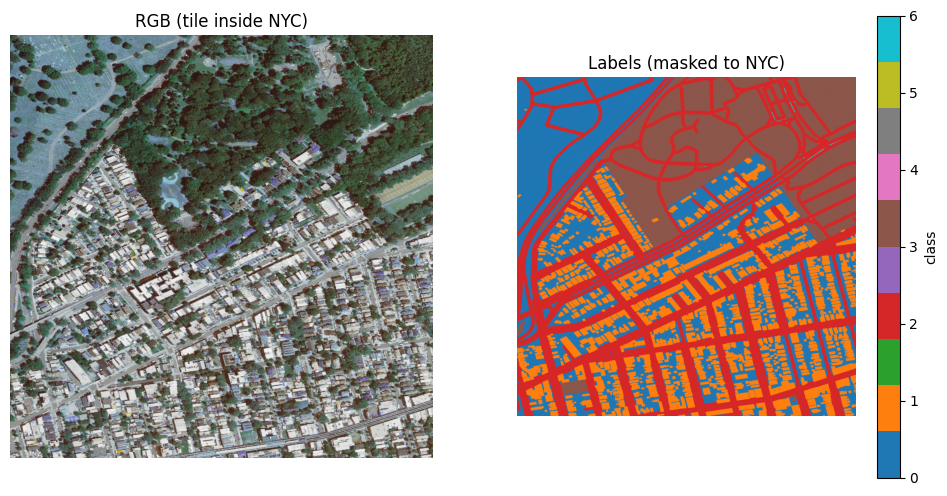

In [ ]:
import random
import numpy as np
import rasterio
from rasterio.windows import Window
import matplotlib.pyplot as plt

# paths
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'
label_fp  = '/content/drive/MyDrive/EarthEngine/NYC_osm_hybrid.tif'

# load your already‐computed nyc_mask (1=inside,0=outside)
# nyc_mask = ...  # shape (H,W) with dtype uint8

# read in everything once
mos = rasterio.open(mosaic_fp)
hds = rasterio.open(label_fp)

H, W = mos.height, mos.width

# pick a tile that is >80% inside NYC and has at least one real class
while True:
    x0 = random.randint(0, W-1024)
    y0 = random.randint(0, H-1024)
    win = Window(x0, y0, 1024, 1024)

    # fraction inside
    submask = nyc_mask[y0:y0+1024, x0:x0+1024]
    frac_in = submask.mean()

    # load rgb & labels
    rgb = mos.read([3,2,1], window=win).transpose(1,2,0)/255.0
    lbl = hds.read(1, window=win)

    # require >80% inside *and* some real labels (0–6) present
    if frac_in > 0.8 and np.any((lbl>=0)&(lbl<=6)):
        break

# mask‑out the outside‐NYC pixels for plotting
lbl_plot = np.where(submask==1, lbl, np.nan)

# plot
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(12,6))
ax1.imshow(rgb);       ax1.set_title("RGB (tile inside NYC)"); ax1.axis('off')
im = ax2.imshow(lbl_plot, cmap='tab10', vmin=0, vmax=6)
ax2.set_title("Labels (masked to NYC)"); ax2.axis('off')
plt.colorbar(im, ax=ax2, ticks=range(7), label="class")
plt.show()


In [ ]:
import rasterio
import numpy as np

# path to your hybrid mask
hybrid_fp = '/content/drive/MyDrive/EarthEngine/NYC_osm_hybrid.tif'

# load it
with rasterio.open(hybrid_fp) as src:
    lab = src.read(1)

# ignore the outside‑NYC nodata
valid = lab != 255

# tally
vals, cnt = np.unique(lab[valid], return_counts=True)
total    = cnt.sum()

# human‑readable names
names = {
    0: 'other',
    1: 'building',
    2: 'road',
    3: 'vegetation',
    4: 'water',
    5: 'bare',
    6: 'parking'
}

print(f"{'class':>10} | {'pixels':>12} | {'percent':>7}")
print("-"*34)
for v,c in zip(vals, cnt):
    pct = 100*c/total
    print(f"{v:>5} {names[v]:>10} | {c:12,d} | {pct:6.2f}%")

     class |       pixels | percent
----------------------------------
    0      other |  855,121,734 |  53.16%
    1   building |  241,626,885 |  15.02%
    2       road |  296,155,173 |  18.41%
    3 vegetation |  167,130,645 |  10.39%
    4      water |   47,489,650 |   2.95%
    6    parking |      917,657 |   0.06%


In [ ]:
import osmnx as ox
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
import numpy as np

# ── ADJUST THESE ─────────────────────────────────────────────────────────────
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'
label_fp  = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'  # your 5‑class mask

# ── 1) Load the mosaic & build rgb_mask ────────────────────────────────────
with rasterio.open(mosaic_fp) as src:
    # read whatever bands give you R, G, B in order:
    rgb = src.read([3,2,1])                   # shape = (3, H, W)
    transform = src.transform
    crs       = src.crs
    H, W      = src.height, src.width

# any non‑zero in any band → we have data here
rgb_mask = np.any(rgb != 0, axis=0)           # shape = (H,W), dtype=bool

# ── 2) Load the labels & build label_mask ───────────────────────────────────
with rasterio.open(label_fp) as src:
    lab = src.read(1)                         # 0–4, 255
label_mask = (lab != 255)                     # True wherever real class

# ── 3) Build the nyc_mask by rasterizing the NYC polygon ──────────────────
# fetch the NYC geometry (WGS84), reproject to your mosaic’s CRS, then burn in
nyc_poly = ox.geocode_to_gdf("New York City, USA").geometry.iloc[0]
nyc_geo  = gpd.GeoSeries([nyc_poly], crs='EPSG:4326')\
              .to_crs(crs).geometry.iloc[0]

nyc_mask = rasterize(
    [(nyc_geo, 1)],
    out_shape=(H, W),
    transform=transform,
    fill=0,
    all_touched=True,
    dtype='uint8'
).astype(bool)

# ── 4) Combine & tally only those pixels where all three are True ───────────
inside = rgb_mask & label_mask & nyc_mask

vals, cnt = np.unique(lab[inside], return_counts=True)
total    = cnt.sum()

names = {
    0: 'other',
    1: 'building',
    2: 'road',
    3: 'vegetation',
    4: 'water',
}

print(f"{'class':>10} | {'pixels':>12} | {'percent':>7}")
print("-"*34)
for v, c in zip(vals, cnt):
    print(f"{v:>5} {names[v]:>10} | {c:12,d} | {100*c/total:6.2f}%")


     class |       pixels | percent
----------------------------------
    0      other |  427,970,445 |  40.51%
    1   building |  217,163,118 |  20.56%
    2       road |  256,959,471 |  24.32%
    3 vegetation |  109,667,998 |  10.38%
    4      water |   44,652,006 |   4.23%


In [ ]:
import osmnx as ox
import geopandas as gpd
import rasterio
import numpy as np
from rasterio.features import rasterize
from rasterio.windows import Window

# ────────────────────────────────────────────────────────────────
# PARAMETERS (tweak as needed)
# ────────────────────────────────────────────────────────────────
mask_fp    = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'  # your 5-class mask
tile_size  = 30      # 30 px (→ 30 m tiles)
cell_size  = 5       # 5 px (→ 5 m micro‑cells)
n_classes  = 5       # classes 0–4
min_inside = 0.9     # only keep tiles ≥80% inside the NYC polygon
# ────────────────────────────────────────────────────────────────

# 1) load label raster & metadata
with rasterio.open(mask_fp) as src:
    lab       = src.read(1)           # (H, W): 0–4 plus 255
    transform = src.transform
    crs       = src.crs
H, W = lab.shape

# 2) rasterize NYC polygon to same grid
nyc_poly = ox.geocode_to_gdf("New York City, USA").geometry.iloc[0]
nyc_poly = gpd.GeoSeries([nyc_poly], crs='EPSG:4326')\
             .to_crs(crs).geometry.iloc[0]

nyc_mask = rasterize(
    [(nyc_poly,1)],
    out_shape=(H, W),
    transform=transform,
    fill=0,
    all_touched=True,
    dtype='uint8'
).astype(bool)   # True = inside NYC

# 3) prepare storage
M = tile_size // cell_size  # e.g. 30//5=6
gscfm_list   = []           # list of M×M×n_classes arrays
tile_origins = []           # corresponding (y0,x0) for each

# 4) slide over 30×30 tiles
for y0 in range(0, H, tile_size):
    for x0 in range(0, W, tile_size):
        # skip edge‑partials
        if y0 + tile_size > H or x0 + tile_size > W:
            continue

        # only keep tiles mostly inside NYC
        tile_nyc = nyc_mask[y0:y0+tile_size, x0:x0+tile_size]
        if tile_nyc.mean() < min_inside:
            continue

        tile_lab = lab[y0:y0+tile_size, x0:x0+tile_size]

        # init M×M×C
        gscfm = np.zeros((M, M, n_classes), dtype=float)

        # fill each micro–cell
        for i in range(M):
            for j in range(M):
                ys, xs = i*cell_size, j*cell_size
                sub_lab  = tile_lab[ys:ys+cell_size, xs:xs+cell_size]
                sub_nyc  = tile_nyc[ys:ys+cell_size, xs:xs+cell_size]

                # only count pixels inside polygon
                inside_idx = sub_nyc
                total = inside_idx.sum()
                if total == 0:
                    # no in‑polygon pixels here → leave as zeros
                    continue

                # compute fraction per class
                for l in range(n_classes):
                    gscfm[i, j, l] = np.count_nonzero(
                        (sub_lab == l) & inside_idx
                    ) / total

        gscfm_list.append(gscfm)
        tile_origins.append((y0, x0))

print(f"Generated {len(gscfm_list):,} GSCFM blocks of shape {M}×{M}×{n_classes}")


Generated 1,784,575 GSCFM blocks of shape 6×6×5


In [ ]:
!pip install osmnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.9/99.9 kB 3.7 MB/s eta 0:00:00


In [ ]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 110.1 MB/s eta 0:00:00


In [ ]:
import osmnx as ox
import rasterio
from shapely.geometry import box

# 1) Paths
mosaic_fp = '/content/drive/MyDrive/EarthEngine/NYC_mosaic.tif'

# 2) Load mosaic bounds & CRS
with rasterio.open(mosaic_fp) as src:
    mb  = src.bounds    # left, bottom, right, top
    crs = src.crs

# 3) Rectangle of the full TIFF footprint
mosaic_rect = box(mb.left, mb.bottom, mb.right, mb.top)

# 4) Fetch & reproject NYC boundary
gdf = ox.geocode_to_gdf("New York City, USA")  # GeoDataFrame (WGS84)
gdf = gdf.to_crs(crs)                          # now in your mosaic’s CRS
nyc = gdf.geometry.iloc[0]                     # shapely MultiPolygon

# 5) Compute the intersection box
valid_area = mosaic_rect.intersection(nyc)
minx, miny, maxx, maxy = valid_area.bounds

print("Overlap bounding box (in CRS):")
print(f"  min X (lon): {minx:.6f}")
print(f"  min Y (lat): {miny:.6f}")
print(f"  max X (lon): {maxx:.6f}")
print(f"  max Y (lat): {maxy:.6f}")


Overlap bounding box (in CRS):
  min X (lon): -74.258843
  min Y (lat): 40.477404
  max X (lon): -73.700233
  max Y (lat): 40.917587


In [ ]:
import rasterio

indices_fp = '/content/drive/MyDrive/EarthEngine/NYC_L8_indices_30m.tif'
with rasterio.open(indices_fp) as src:
    ndvi  = src.read(1)
    ndbi  = src.read(2)
    ndwi  = src.read(3)
    tr    = src.transform
    crs   = src.crs
    H, W  = src.height, src.width

In [ ]:
import osmnx as ox
import geopandas as gpd
import rasterio
import numpy as np
from rasterio.features import rasterize
import pickle

# ───────── PARAMETERS ─────────
mask_fp    = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'
tile_size  = 30     # 30 px → 30 m
cell_size  = 5      # 5 px → 5 m
n_classes  = 5      # 0–4
min_inside = 0.9    # keep tiles ≥90% in NYC

# ─── 1) load mask & CRS info ───
with rasterio.open(mask_fp) as src:
    lab       = src.read(1)
    transform = src.transform
    crs       = src.crs
H, W = lab.shape

# ─── 2) rasterize NYC poly ───
nyc_poly = ox.geocode_to_gdf("New York City, USA").geometry.iloc[0]
nyc_poly = gpd.GeoSeries([nyc_poly], crs='EPSG:4326')\
             .to_crs(crs).geometry.iloc[0]
nyc_mask = rasterize(
    [(nyc_poly,1)], out_shape=(H,W),
    transform=transform, fill=0,
    all_touched=True, dtype='uint8'
).astype(bool)

# ─── 3) slide & build GSCFM ───
M = tile_size // cell_size  # e.g. 30//5=6
gscfm_list   = []
tile_origins = []

for y0 in range(0, H, tile_size):
    for x0 in range(0, W, tile_size):
        if y0+tile_size>H or x0+tile_size>W:
            continue
        tile_nyc = nyc_mask[y0:y0+tile_size, x0:x0+tile_size]
        if tile_nyc.mean() < min_inside:
            continue

        tile_lab = lab[y0:y0+tile_size, x0:x0+tile_size]
        gscfm = np.zeros((M, M, n_classes), dtype=float)

        for i in range(M):
            for j in range(M):
                sub_lab = tile_lab[i*cell_size:(i+1)*cell_size,
                                   j*cell_size:(j+1)*cell_size]
                sub_msk = tile_nyc[i*cell_size:(i+1)*cell_size,
                                   j*cell_size:(j+1)*cell_size]
                total = sub_msk.sum()
                if total == 0:
                    continue
                for l in range(n_classes):
                    gscfm[i,j,l] = np.count_nonzero(
                        (sub_lab==l) & sub_msk
                    )/total

        gscfm_list.append(gscfm)
        tile_origins.append((y0, x0))

print(f"Generated {len(gscfm_list):,} blocks of shape {M}×{M}×{n_classes}")

# ─── 4) pickle to Drive ───
out_fp = '/content/drive/MyDrive/EarthEngine/gscfm_and_origins.pkl'
with open(out_fp, 'wb') as f:
    pickle.dump({
        'gscfm_list':   gscfm_list,
        'tile_origins': tile_origins
    }, f)

print("Saved GSCFM + origins to", out_fp)


Generated 1,784,575 blocks of shape 6×6×5
Saved GSCFM + origins to /content/drive/MyDrive/EarthEngine/gscfm_and_origins.pkl


In [ ]:
import numpy as np
import rasterio

# reopen your files
mask_fp    = '/content/drive/MyDrive/EarthEngine/NYC_osm_labels.tif'
indices_fp = '/content/drive/MyDrive/EarthEngine/NYC_L8_indices_30m.tif'

mos_ds = rasterio.open(mask_fp)    # 1 m mask/mosaic
idx_ds = rasterio.open(indices_fp) # 30 m indices with bands [NDVI, NDBI, NDWI]

# your precomputed lists:
#   gscfm_list   = list of (6×6×5) numpy arrays
#   tile_origins = list of (y0, x0) for each block (in 1 m pixels)
#   nyc_mask     = 2D boolean array (True = inside NYC) at 1 m resolution

M         = gscfm_list[0].shape[0]   # should be 6
tile_size = M * 5                    # = 30 pixels → 30 m

X = []
for gscfm, (y0, x0) in zip(gscfm_list, tile_origins):
    # compute the center pixel coordinates in the 1 m grid
    cy = int(y0 + tile_size/2)
    cx = int(x0 + tile_size/2)

    # skip any tile whose center isn’t inside the NYC polygon
    if not nyc_mask[cy, cx]:
        continue

    # map that center pixel → map coords → 30 m pixel row/col
    mx, my = mos_ds.transform * (cx, cy)
    row30, col30 = idx_ds.index(mx, my)

    # read the three indices from the 30 m raster
    ndvi = idx_ds.read(1)[row30, col30]
    ndbi = idx_ds.read(2)[row30, col30]
    ndwi = idx_ds.read(3)[row30, col30]

    # skip if any are nodata
    if np.isnan(ndvi) or np.isnan(ndbi) or np.isnan(ndwi):
        continue

    # flatten GSCFM (6*6*5=180 dims) + 3 indices → 183‑dim vector
    feat = np.concatenate([gscfm.flatten(), [ndvi, ndbi, ndwi]])
    X.append(feat)

X = np.vstack(X)
print("Built feature matrix X with shape:", X.shape)


Built feature matrix X with shape: (1768179, 183)


In [ ]:
import numpy as np

out_fp = '/content/drive/MyDrive/EarthEngine/X_features.npy'
np.save(out_fp, X)
print("Saved feature matrix X to", out_fp)


Saved feature matrix X to /content/drive/MyDrive/EarthEngine/X_features.npy
